In [27]:
import sys
sys.path.append("../")
import time

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data

import ThinLens.Elements as Elements
import ThinLens.Maps as Maps
from ThinLens.Models import F0D0Model, SIS18_Cell_minimal, SIS18_Cell, \
    SIS18_Lattice_minimal, SIS18_Lattice

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
from IPython.display import set_matplotlib_formats, display
set_matplotlib_formats('pdf', "svg")
import matplotlib.pyplot as plt
import numpy as np

import cpymad.madx

from ThinLens.Beam import Beam
import tools.madX
import tools.plot
import tools.tuneFFT

In [28]:
# general
# torch.set_printoptions(precision=4, sci_mode=False)

dim = 6
slices = 4
quadSliceMultiplicity = 1
dtype = torch.double
device = torch.device("cpu")
outputPerElement = True  # exceeds outputAtBPM
outputAtBPM = True

# set up models
Lattice = SIS18_Lattice

model = Lattice(dim=dim, slices=slices, quadSliceMultiplicity=quadSliceMultiplicity,
                dtype=dtype,).to(device)

perturbedModel = Lattice(dim=dim, slices=slices, quadSliceMultiplicity=quadSliceMultiplicity,
                         dtype=dtype).to(device)

model.requires_grad_(False)
perturbedModel.requires_grad_(False)

SIS18_Lattice(
  (elements): ModuleList(
    (0): Drift(
      (map): DriftMap()
      (maps): ModuleList(
        (0): DriftMap()
      )
    )
    (1): RBen(
      (maps): ModuleList(
        (0): EdgeKick()
        (1): DriftMap()
        (2): DipoleKick()
        (3): DriftMap()
        (4): DriftMap()
        (5): DipoleKick()
        (6): DriftMap()
        (7): DriftMap()
        (8): DipoleKick()
        (9): DriftMap()
        (10): DriftMap()
        (11): DipoleKick()
        (12): DriftMap()
        (13): EdgeKick()
      )
    )
    (2): Drift(
      (map): DriftMap()
      (maps): ModuleList(
        (0): DriftMap()
      )
    )
    (3): RBen(
      (maps): ModuleList(
        (0): EdgeKick()
        (1): DriftMap()
        (2): DipoleKick()
        (3): DriftMap()
        (4): DriftMap()
        (5): DipoleKick()
        (6): DriftMap()
        (7): DriftMap()
        (8): DipoleKick()
        (9): DriftMap()
        (10): DriftMap()
        (11): DipoleKick()
        (

In [29]:
# perturb model
std = 1e-2
for element in perturbedModel.elements:
    if type(element) is Elements.Quadrupole:
        k1n = element.k1n.item()
        k1n = k1n + torch.normal(0, std, size=(1,))
        element.k1n = nn.Parameter(k1n, requires_grad=False)
        element.shareWeights()

for i in range(len(model.elements)):
    if type(model.elements[i]) is Elements.Quadrupole:
        print(model.elements[i].k1n.item() - perturbedModel.elements[i].k1n.item())

-0.006110144647598292
-0.01284079415512085
-0.024138714855194143
-0.017138076814651515
0.0013038052825927737
0.0023207406349181614
-0.016362560781478908
0.0017429723052978519
0.010716174060821482
-0.008400780948638942
0.02145825164604187
-0.00611981350708013
0.01382957598304746
-4.048807334899873e-05
-0.00028803545761113547
-0.007170779499053981
0.008662743738174439
-0.00527837473678594
-0.00013924935722353649
0.011364652088165283
0.0009221772499083958
-0.007950646671295192
0.023258758953094483
0.010802481586456247
-0.003389818462371852
-0.006931381055831909
-0.021424676959991507
0.007788436618804906
0.00956441300201416
0.006627593452453562
-0.010006708892822291
0.019915027788162232
0.0019653777427672825
-0.017396284135818507
5.097525405883818e-05
0.005546484405517527


In [30]:
# train set
beam = Beam(mass=18.798, energy=19.0, exn=1.258e-6, eyn=2.005e-6, sigt=0.01, sige=0.000, particles=500)
bunch = beam.bunch[:].to(device)
label = perturbedModel(bunch, outputPerElement=outputPerElement, outputAtBPM=outputAtBPM).to(device)

trainSet = torch.utils.data.TensorDataset(bunch, label)
trainLoader = torch.utils.data.DataLoader(trainSet, batch_size=25,
                                          shuffle=True, num_workers=2)


plot initial model properties

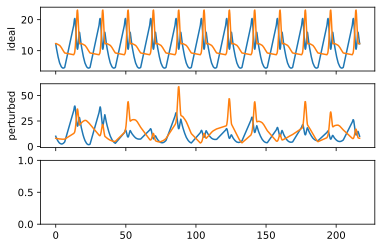

In [31]:
# plot initial trajectories
figTrajectories, axesTrajectories = plt.subplots(2, 2, sharex=True, figsize=(12,8))
for i in range(len(axesTrajectories)):
    for j in range(len(axesTrajectories[i])):
        axesTrajectories[i, j].ticklabel_format(style="sci", scilimits=(0,0))

initialTrajectoriesDifference = tools.plot.track(model, bunch, 1) - tools.plot.track(perturbedModel, bunch, 1)
tools.plot.trajectories(axesTrajectories[0, 0], initialTrajectoriesDifference, model, plane="x")
tools.plot.trajectories(axesTrajectories[0, 1], initialTrajectoriesDifference, model, plane="y")
axesTrajectories[0, 0].set_ylabel("initial diff.")

# plot inital beta
figBeta, axesBeta = plt.subplots(3, sharex=True)
tools.plot.betaMadX(axesBeta[0], model.madX(), )
axesBeta[0].set_ylabel("ideal")

try:
    tools.plot.betaMadX(axesBeta[1], perturbedModel.madX(), )
except cpymad.madx.TwissFailed:
    print("warning: twiss for perturbed model failed")
axesBeta[1].set_ylabel("perturbed")

plt.show()

Text(0, 0.5, 'initial')

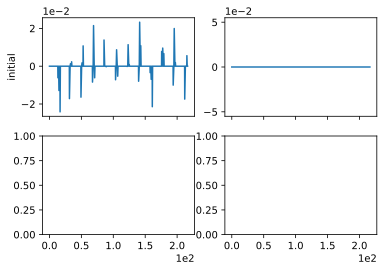

In [32]:
# visualize difference in multipole components
def compareMultipoleStrengths(modelA, modelB):
    diff_k1n, diff_k2n = np.empty(len(modelA.elements)), np.empty(len(modelA.elements))
    diff_k1s, diff_k2s = np.empty(len(modelA.elements)), np.empty(len(modelA.elements))

    for i in range(len(modelA.elements)):
        if type(modelA.elements[i]) is Elements.Quadrupole:
            diff_k1n[i] = modelA.elements[i].k1n.item() - modelB.elements[i].k1n.item()
            diff_k1s[i] = modelA.elements[i].k1s.item() - modelB.elements[i].k1s.item()
            diff_k2n[i] = modelA.elements[i].k2n.item() - modelB.elements[i].k2n.item()
            diff_k2s[i] = modelA.elements[i].k2s.item() - modelB.elements[i].k2s.item()
        else:
            diff_k1n[i] = 0
            diff_k1s[i] = 0
            diff_k2n[i] = 0
            diff_k2s[i] = 0

    return tuple([(diff_k1n, diff_k2n), (diff_k1s, diff_k2s),])

initialDiffNormal, initialDiffSkew = compareMultipoleStrengths(model, perturbedModel)

multipoleFig, multipoleAxes = plt.subplots(2, 2, sharex=True)
for i in range(len(multipoleAxes)):
    for j in range(len(multipoleAxes[i])):
        multipoleAxes[i, j].ticklabel_format(style="sci", scilimits=(0,0))

multipoleAxes[0, 0].plot(model.positions, initialDiffNormal[0])
multipoleAxes[0, 1].plot(model.positions, initialDiffNormal[1])

multipoleAxes[0, 0].set_ylabel("initial")

In [33]:
# with open("/home/conrad/ThesisWorkspace/BayesianOptimization/GaussianPertubation/model.json", "w") as f:
#     model.dumpJSON(f)
# with open("/home/conrad/ThesisWorkspace/BayesianOptimization/GaussianPertubation/perturbedModel.json", "w") as f:
#     perturbedModel.dumpJSON(f)

setup training

In [34]:
# activate gradients on kick maps
for element in model.elements:
    if type(element) is Elements.Quadrupole:
        element.k1n.requires_grad_(True)
        element.k2n.requires_grad_(True)
        
        element.k1s.requires_grad_(False)
        element.k2s.requires_grad_(False)

# set up optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-2)
criterion = nn.MSELoss()


In [35]:
epochs = 25

# train loop
t0 = time.time()

for epoch in range(epochs):
    for i, data in enumerate(trainLoader, 0):
        bunch, label = data[0], data[1]

        optimizer.zero_grad()

        out = model(bunch, outputPerElement=outputPerElement, outputAtBPM=outputAtBPM)

        # loss = criterion(out, label)  # full phase-space
        loss = criterion(out[:, [0, 2], :], label[:, [0, 2], :])  # only x-, y-plane

        loss.backward()
        optimizer.step()

    # if epoch % 10 == 9:
    #     print(loss.item())
    print(loss.item())

print("training completed within {:.2f}s".format(time.time() - t0))

1.3236294857169518e-11
2.643359700229625e-12
1.1149634053240998e-12
1.2362148616655547e-12
1.0439586233069032e-12
6.977320280873887e-13
8.586604616555202e-13
7.758841677932596e-13
7.101390690576852e-13
6.229055408183496e-13
4.3874448952860726e-13
4.3606437737837763e-13
3.6080792873952847e-13
4.3395266209352177e-13
3.8718276003391156e-13
4.2124372797498805e-13
3.9064793131939903e-13
3.50334103367145e-13
3.261109566306791e-13
2.907986215927416e-13
3.34164883202945e-13
2.525423229966514e-13
2.321650577264473e-13
2.6301807296434145e-13
2.5453757491109066e-13
training completed within 738.31s


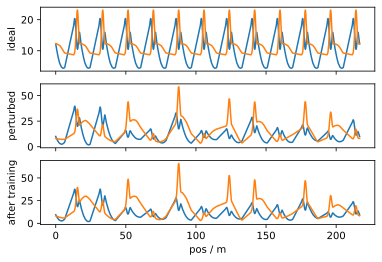

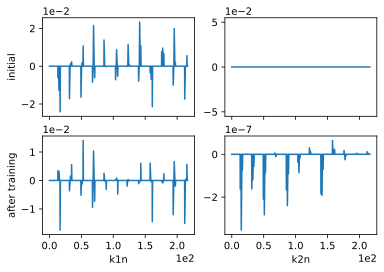

In [36]:
# plot final trajectories
trajectoriesDifference = tools.plot.track(model, bunch, 1) - tools.plot.track(perturbedModel, bunch, 1)

axesTrajectories[1, 0].clear()
tools.plot.trajectories(axesTrajectories[1, 0], trajectoriesDifference, model, plane="x")
axesTrajectories[1, 1].clear()
tools.plot.trajectories(axesTrajectories[1, 1], trajectoriesDifference, model, plane="y")

axesTrajectories[1, 0].set_ylabel("after training")
axesTrajectories[1, 0].set_xlabel("hor. pos / m")
axesTrajectories[1, 1].set_xlabel("ver. pos / m")

display(figTrajectories)

# plot final beta
axesBeta[2].clear()
try:
    tools.plot.betaMadX(axesBeta[2], model.madX())
except cpymad.madx.TwissFailed:
    print("twiss failed for trained model")
    axesBeta[2].plot(model.endPositions, torch.zeros(len(model.endPositions)))

axesBeta[2].set_ylabel("after training")
axesBeta[2].set_xlabel("pos / m")

display(figBeta)

# plot final deviation in multipole strengths
finalDiffNormal, finalDiffSkew = compareMultipoleStrengths(model, perturbedModel)

multipoleAxes[1, 0].plot(model.positions, finalDiffNormal[0])
multipoleAxes[1, 1].plot(model.positions, finalDiffNormal[1])

multipoleAxes[1, 0].set_ylabel("after training")
multipoleAxes[1, 0].set_xlabel("k1n")
multipoleAxes[1, 1].set_xlabel("k2n")

display(multipoleFig)

In [37]:
torch.set_printoptions(precision=3, sci_mode=False)
print(model.rMatrix())

tensor([[ 1.424,  9.098,  0.000,  0.000,  0.000,  0.000],
        [-0.416, -1.958,  0.000,  0.000,  0.000,  0.000],
        [ 0.000,  0.000, -0.869,  2.417,  0.000,  0.000],
        [ 0.000,  0.000, -0.038, -1.045,  0.000,  0.000],
        [-0.151,  0.455,  0.000,  0.000,  1.000,  0.000],
        [ 0.000,  0.000,  0.000,  0.000,  0.000,  1.000]], dtype=torch.float64,
       grad_fn=<MmBackward>)


In [38]:
for element in model.elements:
    if type(element) is Elements.Quadrupole:
        print("k2n={:.2e}, k2s={:.2e}".format(element.k2n.item(), element.k2s.item()))

k2n=-1.63e-07, k2s=0.00e+00
k2n=-3.54e-07, k2s=0.00e+00
k2n=-7.45e-08, k2s=0.00e+00
k2n=-1.62e-07, k2s=0.00e+00
k2n=-1.19e-07, k2s=0.00e+00
k2n=-5.60e-08, k2s=0.00e+00
k2n=-2.09e-07, k2s=0.00e+00
k2n=-2.83e-07, k2s=0.00e+00
k2n=-8.58e-08, k2s=0.00e+00
k2n=6.16e-09, k2s=0.00e+00
k2n=-1.14e-08, k2s=0.00e+00
k2n=2.58e-10, k2s=0.00e+00
k2n=-1.67e-07, k2s=0.00e+00
k2n=-2.40e-07, k2s=0.00e+00
k2n=-9.02e-08, k2s=0.00e+00
k2n=-3.68e-08, k2s=0.00e+00
k2n=-8.59e-08, k2s=0.00e+00
k2n=-1.59e-08, k2s=0.00e+00
k2n=2.99e-08, k2s=0.00e+00
k2n=1.35e-08, k2s=0.00e+00
k2n=-1.70e-10, k2s=0.00e+00
k2n=-1.85e-07, k2s=0.00e+00
k2n=-1.92e-07, k2s=0.00e+00
k2n=-7.00e-08, k2s=0.00e+00
k2n=6.46e-08, k2s=0.00e+00
k2n=2.19e-08, k2s=0.00e+00
k2n=2.26e-08, k2s=0.00e+00
k2n=1.83e-08, k2s=0.00e+00
k2n=-2.52e-08, k2s=0.00e+00
k2n=-5.84e-09, k2s=0.00e+00
k2n=-5.92e-10, k2s=0.00e+00
k2n=4.92e-09, k2s=0.00e+00
k2n=1.86e-09, k2s=0.00e+00
k2n=1.23e-08, k2s=0.00e+00
k2n=5.22e-09, k2s=0.00e+00
k2n=7.49e-10, k2s=0.00e+00


In [39]:
for element in model.elements:
    if type(element) is Elements.Quadrupole:
        print("k1n={:.2e}, k1s={:.2e}".format(element.k1n.item(), element.k1s.item()))

k1n=3.22e-01, k1s=0.00e+00
k1n=-4.62e-01, k1s=0.00e+00
k1n=6.31e-01, k1s=0.00e+00
k1n=3.26e-01, k1s=0.00e+00
k1n=-4.78e-01, k1s=0.00e+00
k1n=6.28e-01, k1s=0.00e+00
k1n=3.24e-01, k1s=0.00e+00
k1n=-4.81e-01, k1s=0.00e+00
k1n=6.28e-01, k1s=0.00e+00
k1n=3.11e-01, k1s=0.00e+00
k1n=-4.89e-01, k1s=0.00e+00
k1n=6.24e-01, k1s=0.00e+00
k1n=3.01e-01, k1s=0.00e+00
k1n=-4.78e-01, k1s=0.00e+00
k1n=6.22e-01, k1s=0.00e+00
k1n=3.20e-01, k1s=0.00e+00
k1n=-4.86e-01, k1s=0.00e+00
k1n=6.25e-01, k1s=0.00e+00
k1n=3.11e-01, k1s=0.00e+00
k1n=-4.89e-01, k1s=0.00e+00
k1n=6.24e-01, k1s=0.00e+00
k1n=3.19e-01, k1s=0.00e+00
k1n=-5.02e-01, k1s=0.00e+00
k1n=6.20e-01, k1s=0.00e+00
k1n=3.22e-01, k1s=0.00e+00
k1n=-4.72e-01, k1s=0.00e+00
k1n=6.32e-01, k1s=0.00e+00
k1n=3.04e-01, k1s=0.00e+00
k1n=-4.88e-01, k1s=0.00e+00
k1n=6.20e-01, k1s=0.00e+00
k1n=3.10e-01, k1s=0.00e+00
k1n=-4.91e-01, k1s=0.00e+00
k1n=6.21e-01, k1s=0.00e+00
k1n=3.15e-01, k1s=0.00e+00
k1n=-4.78e-01, k1s=0.00e+00
k1n=6.25e-01, k1s=0.00e+00
